# Orientation bias from voxel-grid discretization

Quantifies the artefact introduced by marching-cubes surface extraction on a regular voxel grid:
how much do the measured anisotropy index β and principal-axis orientation vary as the same
abstract triaxial ellipsoid is presented at different orientations relative to the grid?

**Shape**: triaxial ellipsoid with semi-axes A=10, B=6, C=4 (arbitrary distance units).

**Rotation protocols**
- **rot_z**: ellipsoid swept through 12 orientations (0°–165°, 15° steps) **in the axis-0/axis-1 plane** (rotation around array axis-2 = pykarambola z-axis).
- **rot_y**: same 12 orientations **in the axis-0/axis-2 plane** (rotation around array axis-1 = pykarambola y-axis).

**Resolution sweep**: 12 voxel sizes expressed as fractions of A (A/3 coarse → A/100 fine).

**All six rank-2 Minkowski tensors** are evaluated:
- Position tensors: `w020`, `w120`, `w220`, `w320`
- Normal tensors: `w102`, `w202`

For all tensors the fine-resolution (A/100, angle=0) measurement is shown as a dotted reference.

Also demonstrates that scalar Minkowski functionals (w000–w300) converge asymptotically with
resolution without orientation-dependent bias, whereas rank-2 tensor β values carry an
orientation-dependent spread that persists at coarse resolutions.

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import platform
import warnings
import trimesh as tm
from skimage.measure import marching_cubes

import pykarambola

print(f'pykarambola : {pykarambola.__version__}')
print(f'Python      : {platform.python_version()}')
print(f'OS          : {platform.system()} {platform.release()}')
from figure_utils import save_figure_pptx


pykarambola : 0.5.0
Python      : 3.11.13
OS          : Darwin 24.6.0


In [2]:
RESULTS_DIR = os.path.join(os.getcwd(), 'results')
os.makedirs(RESULTS_DIR, exist_ok=True)

# Ellipsoid semi-axes — purely dimensionless; A is the reference length
A, B, C = 10.0, 6.0, 4.0

# Voxel sizes: A/3 (very coarse) → A/100 (fine reference)
_VOX_DENOMS = [3, 5, 8, 10, 15, 20, 30, 40, 50, 60, 80, 100]
HIRES_DENOMS = [n for n in _VOX_DENOMS if n >= 20]

VOX_FRACS   = [1/n for n in _VOX_DENOMS]
VOXEL_SIZES = [A * f for f in VOX_FRACS]
VOX_LABELS  = [f'A/{n}' for n in _VOX_DENOMS]

# Colour per voxel size: viridis — coarse (purple) → fine (yellow)
N_VOX      = len(VOXEL_SIZES)
VOX_CMAP   = plt.cm.viridis
VOX_NORM   = plt.Normalize(vmin=0, vmax=N_VOX - 1)
VOX_COLORS = [VOX_CMAP(VOX_NORM(i)) for i in range(N_VOX)]

# Rotation protocols
PROTOCOLS    = ['rot_z', 'rot_y']
PROT_LABELS  = {'rot_z': 'Rotation around z-axis  (axis-0/axis-1 plane)',
                'rot_y': 'Rotation around y-axis  (axis-0/axis-2 plane)'}

# Rotation angles: 12 orientations in each plane
ANGLES = np.arange(0, 180, 15)

# Fine-reference voxel size (A/100 → converged limit for pykarambola)
FINE_VOX = A / 100.0

# All six rank-2 Minkowski tensors
RANK2 = ['w020', 'w120', 'w220', 'w320', 'w102', 'w202']

# Which eigenvector index is the long axis?
LONG_IDX = {'w020': 2, 'w120': 2, 'w220': 2, 'w320': 2, 'w102': 0, 'w202': 0}

BASE_FONT     = 25
TENSOR_COLORS = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']

print(f'Ellipsoid semi-axes : A={A}, B={B}, C={C}  (dimensionless)')
print(f'All vox/A  ({N_VOX} levels): {[int(A/v) for v in VOXEL_SIZES]}')
print(f'Hi-res vox/A ({len(HIRES_DENOMS)} levels): {HIRES_DENOMS}')
print(f'Protocols  : {PROTOCOLS}')
print(f'Angles     : {list(ANGLES)} deg  ({len(ANGLES)} orientations per protocol)')

Ellipsoid semi-axes : A=10.0, B=6.0, C=4.0  (dimensionless)
All vox/A  (12 levels): [3, 5, 8, 10, 15, 20, 30, 40, 50, 60, 80, 100]
Hi-res vox/A (7 levels): [20, 30, 40, 50, 60, 80, 100]
Protocols  : ['rot_z', 'rot_y']
Angles     : [np.int64(0), np.int64(15), np.int64(30), np.int64(45), np.int64(60), np.int64(75), np.int64(90), np.int64(105), np.int64(120), np.int64(135), np.int64(150), np.int64(165)] deg  (12 orientations per protocol)


In [3]:
def make_ellipsoid_mask(lx, ly, lz, voxel_size, angle_deg, axis='z', pad=4):
    """Binary mask of a triaxial ellipsoid rotated angle_deg in the chosen plane.

    axis='z'  →  rotation in axis-0/axis-1 plane  (around array axis-2 = z)
    axis='y'  →  rotation in axis-0/axis-2 plane  (around array axis-1 = y)
    """
    theta = np.deg2rad(angle_deg)
    if axis == 'z':
        n0 = int(np.ceil(max(lx, ly) / voxel_size)) + pad
        n1 = int(np.ceil(max(lx, ly) / voxel_size)) + pad
        n2 = int(np.ceil(lz          / voxel_size)) + pad
    else:  # 'y'
        n0 = int(np.ceil(max(lx, lz) / voxel_size)) + pad
        n1 = int(np.ceil(ly          / voxel_size)) + pad
        n2 = int(np.ceil(max(lx, lz) / voxel_size)) + pad

    X0, X1, X2 = np.meshgrid(
        np.arange(-n0, n0+1) * voxel_size,
        np.arange(-n1, n1+1) * voxel_size,
        np.arange(-n2, n2+1) * voxel_size,
        indexing='ij',
    )
    if axis == 'z':
        # inverse rotation: test each voxel in the body frame
        X0r =  X0 * np.cos(theta) + X1 * np.sin(theta)
        X1r = -X0 * np.sin(theta) + X1 * np.cos(theta)
        X2r = X2
    else:  # 'y'
        X0r =  X0 * np.cos(theta) + X2 * np.sin(theta)
        X1r = X1
        X2r = -X0 * np.sin(theta) + X2 * np.cos(theta)
    return ((X0r/lx)**2 + (X1r/ly)**2 + (X2r/lz)**2 <= 1.0).astype(np.uint8)


def measure_all(mask, voxel_size, angle_deg, axis='z'):
    """Return β and long-axis eigenvector error for all 6 rank-2 tensors + 4 scalars."""
    with warnings.catch_warnings():
        warnings.simplefilter('ignore')
        r = pykarambola.minkowski_tensors_from_label_image(
            mask, spacing=(voxel_size, voxel_size, voxel_size)
        )[1]

    theta = np.deg2rad(angle_deg)
    if axis == 'z':
        true_axis = np.array([np.cos(theta), np.sin(theta), 0.0])
    else:  # 'y'
        true_axis = np.array([np.cos(theta), 0.0, np.sin(theta)])

    out = {}
    for name in RANK2:
        ev   = r.get(f'{name}_eigvals')
        evec = r.get(f'{name}_eigvecs')
        if ev is None:
            out[f'{name}_beta'] = out[f'{name}_aerr'] = np.nan
            continue
        out[f'{name}_beta'] = float(ev[0] / ev[2])
        la_vec = evec[:, LONG_IDX[name]]
        out[f'{name}_aerr'] = float(np.degrees(
            np.arccos(np.clip(abs(la_vec @ true_axis), 0.0, 1.0))
        ))

    for sc in ('w000', 'w100', 'w200', 'w300'):
        out[sc] = float(r.get(sc, np.nan))
    return out


print('Helpers defined.')

Helpers defined.


In [4]:
# ── Mesh visualizations: 3 orientations separated — coarse (A/10, 10 vox/A) ──
VIZ_ANGLES = [0, 60, 120]
VIZ_RGBA   = [
    [230, 159,   0, 200],   # orange
    [  0, 158, 115, 200],   # teal
    [ 86, 180, 233, 200],   # sky blue
]
OFFSET = 2.5 * A   # separation along axis-0

VOX_COARSE = A / 10.0   # 10 voxels per A

axis_obj = tm.creation.axis(axis_length=A * 0.8, axis_radius=A * 0.03)
scene_coarse = [axis_obj]

for k, (ang, rgba) in enumerate(zip(VIZ_ANGLES, VIZ_RGBA)):
    m_mask = make_ellipsoid_mask(A, B, C, VOX_COARSE, ang)
    verts, faces, _, _ = marching_cubes(
        m_mask.astype(float), level=0.5,
        spacing=(VOX_COARSE, VOX_COARSE, VOX_COARSE),
    )
    verts -= verts.mean(axis=0)
    verts[:, 0] += k * OFFSET
    mesh = tm.Trimesh(vertices=verts, faces=faces, process=False)
    mesh.visual.face_colors = rgba
    scene_coarse.append(mesh)
    print(f'  {ang:3d}deg: {len(faces):,} faces')

print(f'\nCoarse  vox = A/10 = {VOX_COARSE}  (10 voxels per A)')
print('orange=0deg, teal=60deg, blue=120deg')
tm.Scene(scene_coarse).show()

    0deg: 1,512 faces
   60deg: 1,544 faces
  120deg: 1,544 faces

Coarse  vox = A/10 = 1.0  (10 voxels per A)
orange=0deg, teal=60deg, blue=120deg


In [5]:
# ── Mesh visualizations: 3 orientations separated — fine (A/80, 80 vox/A) ────
VOX_FINE = A / 80.0   # 80 voxels per A

axis_obj_fine = tm.creation.axis(axis_length=A * 0.8, axis_radius=A * 0.03)
scene_fine = [axis_obj_fine]

for k, (ang, rgba) in enumerate(zip(VIZ_ANGLES, VIZ_RGBA)):
    m_mask = make_ellipsoid_mask(A, B, C, VOX_FINE, ang)
    verts, faces, _, _ = marching_cubes(
        m_mask.astype(float), level=0.5,
        spacing=(VOX_FINE, VOX_FINE, VOX_FINE),
    )
    verts -= verts.mean(axis=0)
    verts[:, 0] += k * OFFSET
    mesh = tm.Trimesh(vertices=verts, faces=faces, process=False)
    mesh.visual.face_colors = rgba
    scene_fine.append(mesh)
    print(f'  {ang:3d}deg: {len(faces):,} faces')

print(f'\nFine  vox = A/80 = {VOX_FINE}  (80 voxels per A)')
print('orange=0deg, teal=60deg, blue=120deg')
tm.Scene(scene_fine).show()

    0deg: 99,480 faces
   60deg: 100,768 faces
  120deg: 100,768 faces

Fine  vox = A/80 = 0.125  (80 voxels per A)
orange=0deg, teal=60deg, blue=120deg


In [6]:
# ── Fine-resolution reference measurements (angle=0, axis='z') ───────────────
# vox = A/100 → 100 voxels per A — converged limit for pykarambola.
# angle=0 is equivalent for both protocols, so one measurement suffices.
print(f'Computing fine-resolution reference  (vox = A/100 = {FINE_VOX}) ...')
mask_fine = make_ellipsoid_mask(A, B, C, FINE_VOX, angle_deg=0)
FINE_VALS = measure_all(mask_fine, FINE_VOX, angle_deg=0)

FINE_BETA    = {name: FINE_VALS[f'{name}_beta'] for name in RANK2}
FINE_SCALARS = {sc:   FINE_VALS[sc]             for sc in ('w000', 'w100', 'w200', 'w300')}

print('\nFine-resolution β reference:')
for name, val in FINE_BETA.items():
    print(f'  {name}: {val:.6f}')

print('\nFine-resolution scalar reference:')
for sc, val in FINE_SCALARS.items():
    print(f'  {sc} = {val:.6f}')

Computing fine-resolution reference  (vox = A/100 = 0.1) ...

Fine-resolution β reference:
  w020: 0.159836
  w120: 0.220919
  w220: 0.154820
  w320: 0.103546
  w102: 0.322079
  w202: 0.556597

Fine-resolution scalar reference:
  w000 = 1004.682500
  w100 = 195.453457
  w200 = 31.641346
  w300 = 4.188790


In [7]:
# ── Scalar convergence vs. resolution (angle=0, axis='z') ────────────────────
conv_rows = []
for vox in sorted(VOXEL_SIZES, reverse=True):
    mask = make_ellipsoid_mask(A, B, C, vox, angle_deg=0, axis='z')
    vals = measure_all(mask, vox, angle_deg=0, axis='z')
    row  = {'vox': vox, 'vox_per_A': round(A/vox, 1)}
    for sc in ('w000', 'w100', 'w200', 'w300'):
        ref = FINE_SCALARS[sc]
        row[f'{sc}_err'] = 100*abs(vals[sc] - ref) / abs(ref) if abs(ref) > 1e-12 else np.nan
    conv_rows.append(row)
    # print(f'  vox=A/{int(A/vox):d}  done')

DF_CONV = pd.DataFrame(conv_rows)

In [8]:
# ── Main sweep: both protocols × 12 voxel sizes × 12 angles ─────────────────
records = []
for vox in VOXEL_SIZES:
    n_vox = int(A / vox)
    for protocol in PROTOCOLS:
        ax_label = 'z' if protocol == 'rot_z' else 'y'
        for ang in ANGLES:
            mask = make_ellipsoid_mask(A, B, C, vox, ang, axis=ax_label)
            vals = measure_all(mask, vox, ang, axis=ax_label)
            rec  = {'voxel_size': vox, 'n_vox_A': n_vox,
                    'angle_deg': float(ang), 'protocol': protocol}
            rec.update(vals)
            records.append(rec)
    print(f'  vox=A/{n_vox:d}  done')

DF = pd.DataFrame(records)

# ── Hi-res subset (≥A/20) ─────────────────────────────────────────────────────
DF_HI        = DF[DF['n_vox_A'].isin(HIRES_DENOMS)]
HIRES_VOXELS = [v for v in VOXEL_SIZES if int(A/v) in HIRES_DENOMS]
HIRES_COLORS = [VOX_COLORS[i] for i, v in enumerate(VOXEL_SIZES)
                if int(A/v) in HIRES_DENOMS]

  vox=A/3  done
  vox=A/5  done
  vox=A/8  done
  vox=A/10  done
  vox=A/15  done
  vox=A/20  done
  vox=A/30  done
  vox=A/40  done
  vox=A/50  done
  vox=A/60  done
  vox=A/80  done
  vox=A/100  done


In [9]:
# ── Helper ────────────────────────────────────────────────────────────────────
def _summary_table(proto, columns, ref_dict, label, mode='mean_err'):
    """Print one summary table.

    mode='mean_err' → |mean−ref|/|ref| × 100 (%)  — absolute relative error
    mode='spread'   →  std/|ref|        × 100 (%)  — relative orientation spread
    """
    DFp    = DF[DF['protocol'] == proto]
    CW     = 10
    hdrs   = [f'A/{int(A/v)}' for v in VOXEL_SIZES]
    header = f"{'':12}" + ''.join(f'  {h:<{CW}}' for h in hdrs)
    sep    = '-' * len(header)
    if mode == 'mean_err':
        title_suffix = 'abs. mean error = |mean−ref|/|ref|  (%)'
    else:
        title_suffix = 'spread = std/|ref|  (%)'
    print(f'\n{label}  ({proto})   {title_suffix}')
    print(header); print(sep)
    for col in columns:
        ref = ref_dict[col]
        row = f'{col:<12}'
        for vox in VOXEL_SIZES:
            sub = DFp[DFp['voxel_size'] == vox][col]
            if mode == 'mean_err':
                val  = abs(sub.mean() - ref) / abs(ref) * 100
            else:
                val  = sub.std() / abs(ref) * 100
            cell = f'{val:.2f}%'
            row += f'  {cell:<{CW}}'
        print(row)

# ── Tensor β summary ──────────────────────────────────────────────────────────
beta_cols = [f'{name}_beta' for name in RANK2]
beta_refs  = {f'{name}_beta': FINE_BETA[name] for name in RANK2}
for proto in PROTOCOLS:
    _summary_table(proto, beta_cols, beta_refs, 'Tensor β', mode='mean_err')
    _summary_table(proto, beta_cols, beta_refs, 'Tensor β', mode='spread')

# ── Scalar summary ────────────────────────────────────────────────────────────
scalar_refs = {sc: FINE_SCALARS[sc] for sc in ('w000', 'w100', 'w200', 'w300')}
for proto in PROTOCOLS:
    _summary_table(proto, list(scalar_refs), scalar_refs, 'Scalars', mode='mean_err')
    _summary_table(proto, list(scalar_refs), scalar_refs, 'Scalars', mode='spread')


Tensor β  (rot_z)   abs. mean error = |mean−ref|/|ref|  (%)
              A/3         A/5         A/8         A/10        A/15        A/20        A/30        A/40        A/50        A/60        A/80        A/100     
------------------------------------------------------------------------------------------------------------------------------------------------------------
w020_beta     89.75%      14.92%      4.27%       4.41%       2.47%       1.38%       0.55%       0.28%       0.14%       0.05%       0.01%       0.03%     
w120_beta     42.55%      7.29%       4.05%       3.36%       1.98%       1.39%       0.24%       0.15%       0.18%       0.19%       0.20%       0.24%     
w220_beta     51.59%      3.58%       9.10%       0.75%       0.59%       1.34%       0.10%       0.05%       0.75%       0.45%       0.43%       0.57%     
w320_beta     57.27%      55.92%      14.75%      22.48%      12.96%      7.41%       4.79%       2.56%       2.45%       1.52%       0.30%       0.06%   

Saved -> /Users/yk/Desktop/pykarambola_m1/pykarambola/paper/notebooks/results/orientation_bias_beta_rot_z.pdf


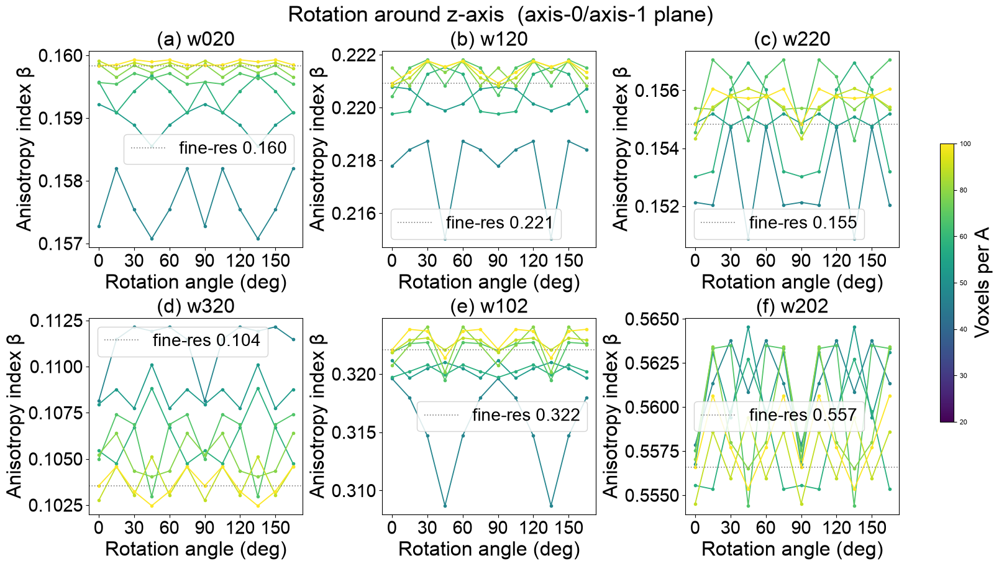

Saved -> /Users/yk/Desktop/pykarambola_m1/pykarambola/paper/notebooks/results/orientation_bias_beta_rot_y.pdf


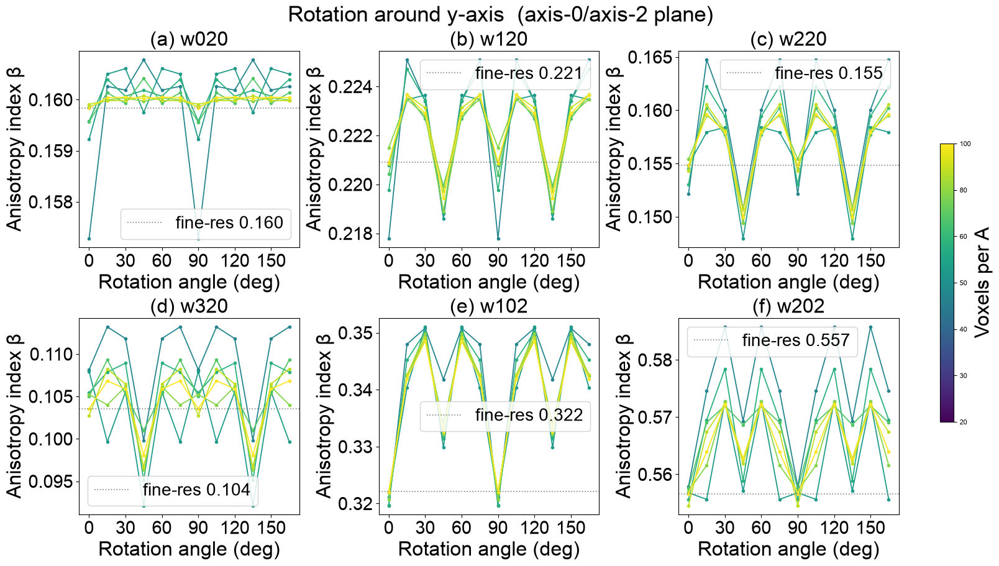

In [10]:
# ── Figure: β vs rotation angle — hi-res only (≥A/20), one figure per protocol
plt.rcParams['font.family'] = 'Arial'
plt.rcParams.update({
    'font.size':       BASE_FONT,
    'axes.titlesize':  BASE_FONT - 2,
    'axes.labelsize':  BASE_FONT - 2,
    'xtick.labelsize': BASE_FONT - 4,
    'ytick.labelsize': BASE_FONT - 4,
    'legend.fontsize': BASE_FONT - 5,
})

N_HIRES = len(HIRES_VOXELS)

for proto in PROTOCOLS:
    DFp = DF_HI[DF_HI['protocol'] == proto]
    fig, axes = plt.subplots(2, 3, figsize=(16, 9), constrained_layout=True)
    fig.suptitle(PROT_LABELS[proto], fontsize=BASE_FONT)

    for idx, name in enumerate(RANK2):
        ax = axes.flat[idx]
        for vox, col in zip(HIRES_VOXELS, HIRES_COLORS):
            sub = DFp[DFp['voxel_size'] == vox].sort_values('angle_deg')
            ax.plot(sub['angle_deg'], sub[f'{name}_beta'],
                    'o-', ms=3, lw=1.3, color=col)
        ax.axhline(FINE_BETA[name], color='gray', ls=':', lw=1.2,
                   label=f'fine-res {FINE_BETA[name]:.3f}')
        ax.set_title(f'({chr(97+idx)}) {name}')
        ax.set_xlabel('Rotation angle (deg)')
        ax.set_ylabel('Anisotropy index \u03b2')
        ax.set_xticks(ANGLES[::2])
        ax.legend(loc='best', framealpha=0.85)

    hires_norm = plt.Normalize(vmin=0, vmax=N_HIRES - 1)
    sm_v = plt.cm.ScalarMappable(cmap=VOX_CMAP, norm=hires_norm)
    sm_v.set_array([])
    cbar = fig.colorbar(sm_v, ax=axes.ravel().tolist(), label='Voxels per A', shrink=0.6)
    cbar.set_ticks(range(N_HIRES))
    cbar.set_ticklabels([int(A/v) for v in HIRES_VOXELS], fontsize=8)

    save_path = os.path.join(RESULTS_DIR, f'orientation_bias_beta_{proto}.pdf')
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    print(f'Saved -> {save_path}')
    plt.show()

Saved -> /Users/yk/Desktop/pykarambola_m1/pykarambola/paper/notebooks/results/orientation_bias_eigvec_rot_z.pdf


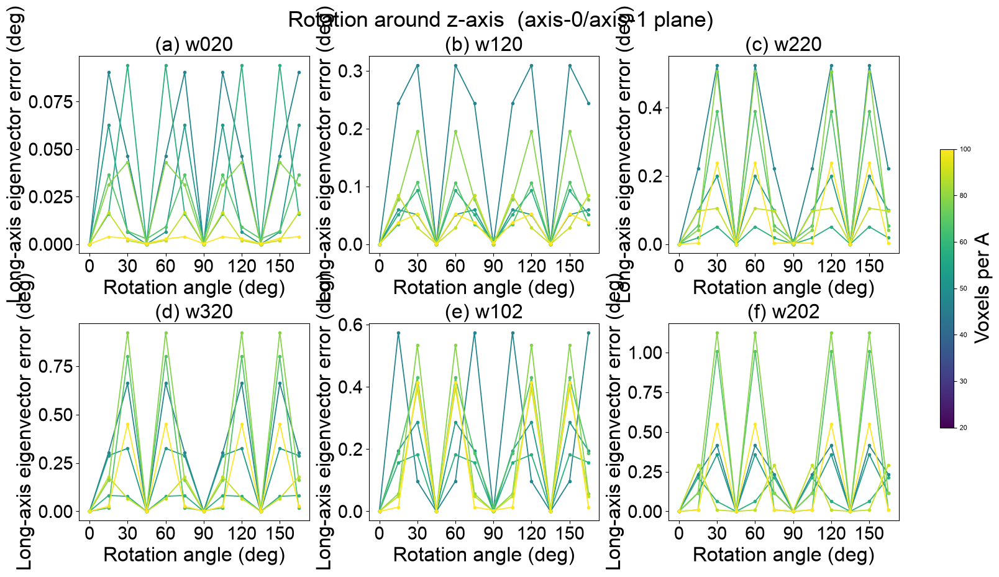

Saved -> /Users/yk/Desktop/pykarambola_m1/pykarambola/paper/notebooks/results/orientation_bias_eigvec_rot_y.pdf


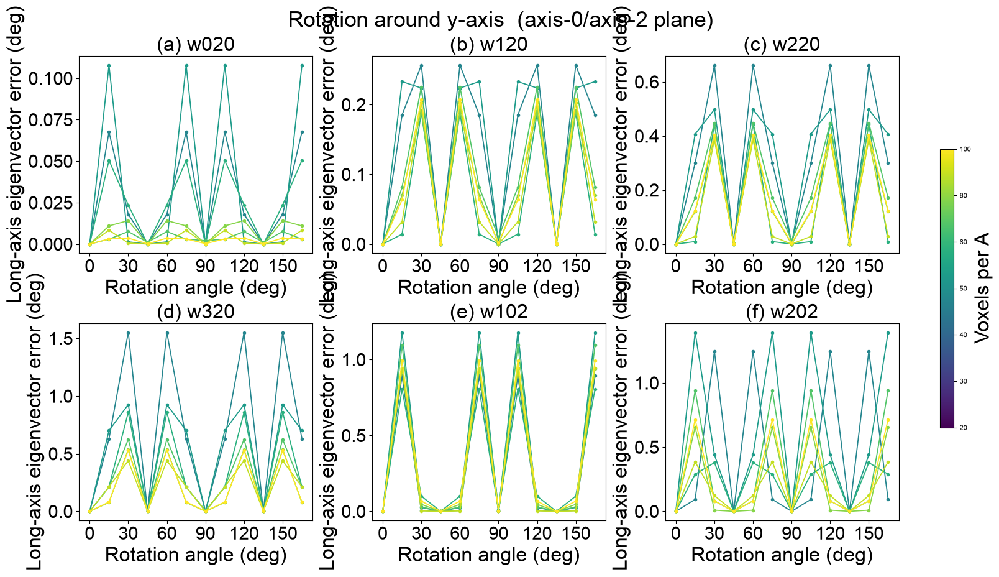

In [11]:
# ── Figure: long-axis eigenvector error vs rotation angle — hi-res only ───────
for proto in PROTOCOLS:
    DFp = DF_HI[DF_HI['protocol'] == proto]
    fig, axes = plt.subplots(2, 3, figsize=(16, 9), constrained_layout=True)
    fig.suptitle(PROT_LABELS[proto], fontsize=BASE_FONT)

    for idx, name in enumerate(RANK2):
        ax = axes.flat[idx]
        for vox, col in zip(HIRES_VOXELS, HIRES_COLORS):
            sub = DFp[DFp['voxel_size'] == vox].sort_values('angle_deg')
            ax.plot(sub['angle_deg'], sub[f'{name}_aerr'],
                    'o-', ms=3, lw=1.3, color=col)
        ax.set_title(f'({chr(97+idx)}) {name}')
        ax.set_xlabel('Rotation angle (deg)')
        ax.set_ylabel('Long-axis eigenvector error (deg)')
        ax.set_xticks(ANGLES[::2])

    hires_norm = plt.Normalize(vmin=0, vmax=N_HIRES - 1)
    sm_v = plt.cm.ScalarMappable(cmap=VOX_CMAP, norm=hires_norm)
    sm_v.set_array([])
    cbar = fig.colorbar(sm_v, ax=axes.ravel().tolist(), label='Voxels per A', shrink=0.6)
    cbar.set_ticks(range(N_HIRES))
    cbar.set_ticklabels([int(A/v) for v in HIRES_VOXELS], fontsize=8)

    save_path = os.path.join(RESULTS_DIR, f'orientation_bias_eigvec_{proto}.pdf')
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    print(f'Saved -> {save_path}')
    plt.show()

Saved -> /Users/yk/Desktop/pykarambola_m1/pykarambola/paper/notebooks/results/orientation_bias_scalars_vs_angle_rot_z.pdf


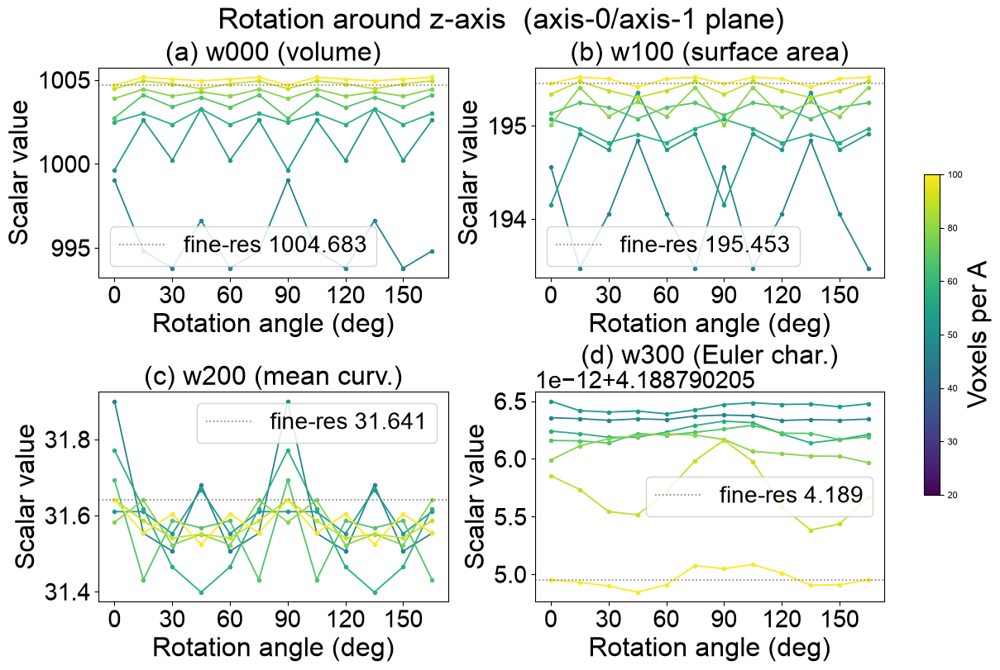

Saved -> /Users/yk/Desktop/pykarambola_m1/pykarambola/paper/notebooks/results/orientation_bias_scalars_vs_angle_rot_y.pdf


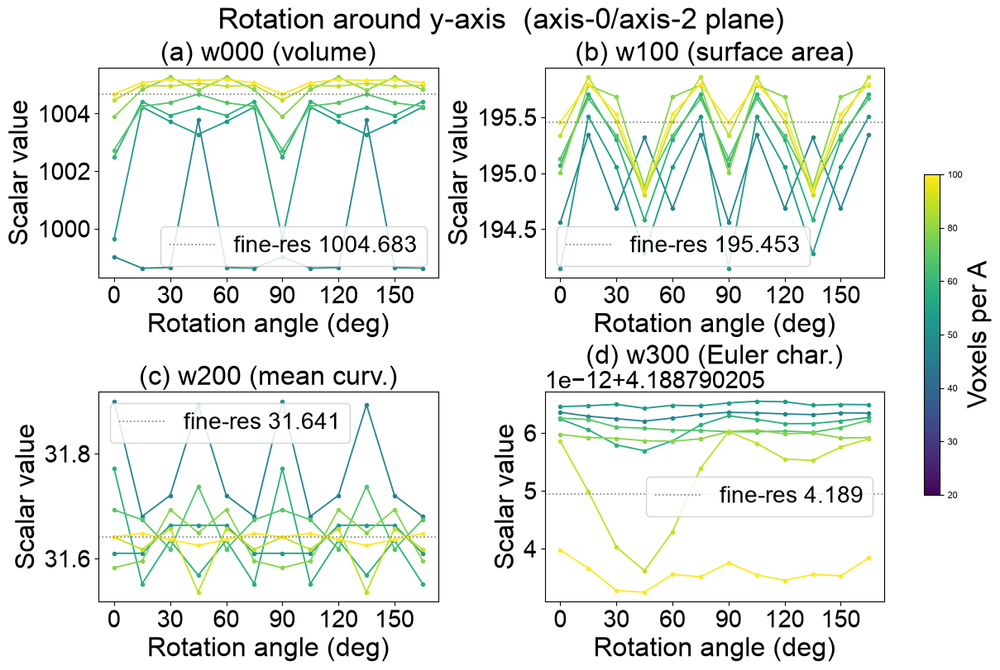

In [12]:
# ── Figure: scalar values vs rotation angle — hi-res only (≥A/20) ────────────
_SC_TITLES = {
    'w000': 'w000 (volume)',
    'w100': 'w100 (surface area)',
    'w200': 'w200 (mean curv.)',
    'w300': 'w300 (Euler char.)',
}

for proto in PROTOCOLS:
    DFp = DF_HI[DF_HI['protocol'] == proto]
    fig, axes = plt.subplots(2, 2, figsize=(12, 8), constrained_layout=True)
    fig.suptitle(PROT_LABELS[proto], fontsize=BASE_FONT)

    for idx, sc in enumerate(['w000', 'w100', 'w200', 'w300']):
        ax = axes.flat[idx]
        for vox, col in zip(HIRES_VOXELS, HIRES_COLORS):
            sub = DFp[DFp['voxel_size'] == vox].sort_values('angle_deg')
            ax.plot(sub['angle_deg'], sub[sc], 'o-', ms=3, lw=1.3, color=col)
        ax.axhline(FINE_SCALARS[sc], color='gray', ls=':', lw=1.2,
                   label=f'fine-res {FINE_SCALARS[sc]:.3f}')
        ax.set_title(f'({chr(97+idx)}) {_SC_TITLES[sc]}')
        ax.set_xlabel('Rotation angle (deg)')
        ax.set_ylabel('Scalar value')
        ax.set_xticks(ANGLES[::2])
        ax.legend(loc='best', framealpha=0.85)

    hires_norm = plt.Normalize(vmin=0, vmax=N_HIRES - 1)
    sm_v = plt.cm.ScalarMappable(cmap=VOX_CMAP, norm=hires_norm)
    sm_v.set_array([])
    cbar = fig.colorbar(sm_v, ax=axes.ravel().tolist(), label='Voxels per A', shrink=0.6)
    cbar.set_ticks(range(N_HIRES))
    cbar.set_ticklabels([int(A/v) for v in HIRES_VOXELS], fontsize=8)

    save_path = os.path.join(RESULTS_DIR, f'orientation_bias_scalars_vs_angle_{proto}.pdf')
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    print(f'Saved -> {save_path}')
    plt.show()

Saved -> /Users/yk/Desktop/pykarambola_m1/pykarambola/paper/notebooks/results/orientation_bias_bias_sigma_rot_z.pdf


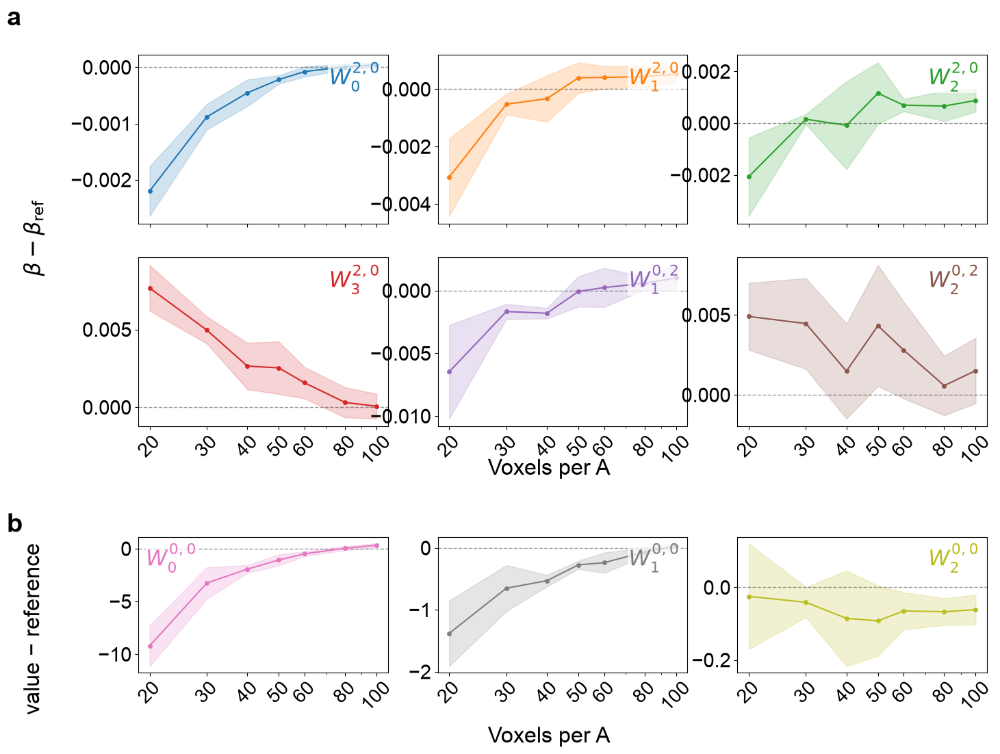

Saved -> /Users/yk/Desktop/pykarambola_m1/pykarambola/paper/notebooks/results/orientation_bias_bias_sigma_rot_y.pdf


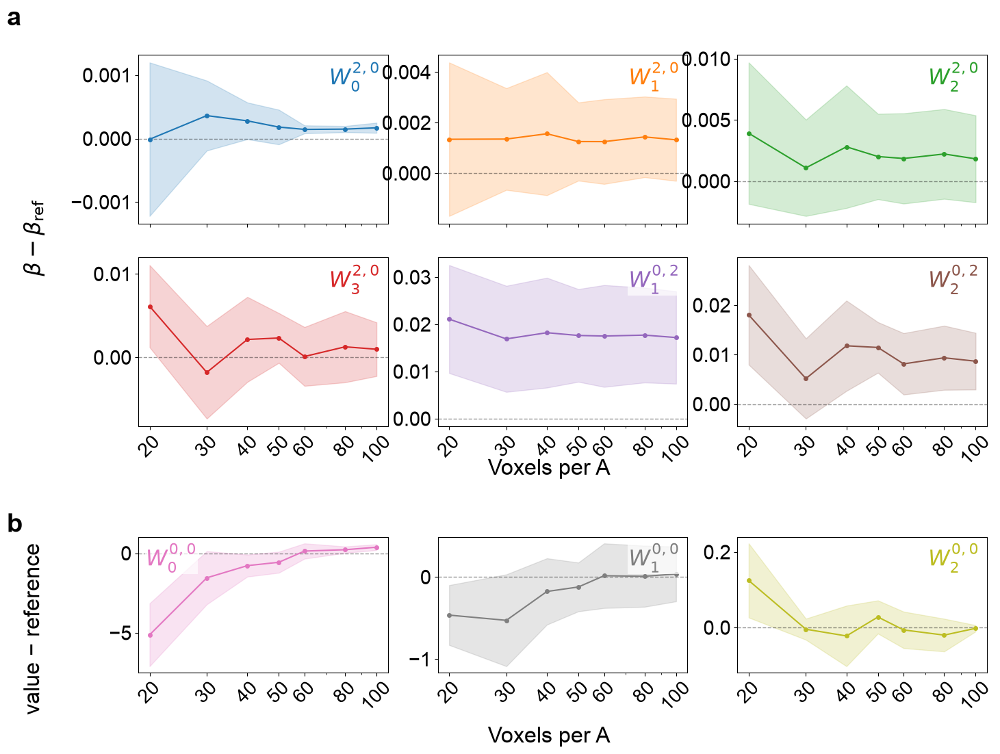

In [13]:
# ── Figure: bias ± σ shaded band vs resolution — tensors (a) + scalars (b) ───
# bias(h) = mean(measurement) − reference  over 12 orientations  [systematic offset]
# σ(h)    = std(measurement)               over 12 orientations  [orientation spread]
# reference = fine-resolution (A/100) value
#
# x: voxels/A (log),  y: value − reference (linear, absolute units)
# shaded band = bias ± σ;  dashed line at 0 = perfect convergence
# w300 (Euler characteristic) is a topological invariant, identically zero bias/spread, omitted.
# Only hi-res range shown: A/20 to A/100 (20–100 voxels per A).

TENSOR_LATEX = {
    'w020': r'$W_0^{2,0}$',
    'w120': r'$W_1^{2,0}$',
    'w220': r'$W_2^{2,0}$',
    'w320': r'$W_3^{2,0}$',
    'w102': r'$W_1^{0,2}$',
    'w202': r'$W_2^{0,2}$',
}
SCALAR_LATEX = {
    'w000': r'$W_0^{0,0}$',
    'w100': r'$W_1^{0,0}$',
    'w200': r'$W_2^{0,0}$',
}

# 10 fully distinct colors: tensors get tab10[0:6], scalars get tab10[6:9]
TENSOR_COLORS_PLOT = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
_SC_COLORS         = ['#e377c2', '#7f7f7f', '#bcbd22']

plt.rcParams['font.family'] = 'Arial'
plt.rcParams.update({
    'font.size':       BASE_FONT,
    'axes.titlesize':  BASE_FONT - 2,
    'axes.labelsize':  BASE_FONT - 2,
    'xtick.labelsize': BASE_FONT - 4,
    'ytick.labelsize': BASE_FONT - 4,
    'legend.fontsize': BASE_FONT - 5,
})

_vpas_all = HIRES_DENOMS   # [20, 30, 40, 50, 60, 80, 100]
SCALARS   = ['w000', 'w100', 'w200']   # w300 omitted (topological invariant, zero bias)

for proto in PROTOCOLS:
    fig     = plt.figure(figsize=(16, 11))
    subfigs = fig.subfigures(2, 1, height_ratios=[2, 1], hspace=0.08)

    # ── Panel a: six rank-2 tensor subplots ───────────────────────────────────
    sfig_t = subfigs[0]
    sfig_t.text(0.005, 0.98, 'a', fontsize=BASE_FONT + 2, fontweight='bold', va='top')
    axs_t  = sfig_t.subplots(2, 3, sharex=True)
    sfig_t.supxlabel('Voxels per A', fontsize=BASE_FONT - 2, y=0.0001)
    sfig_t.supylabel(r'$\beta - \beta_\mathrm{ref}$', fontsize=BASE_FONT - 2)

    for idx, name in enumerate(RANK2):
        ax  = axs_t.flat[idx]
        ref = FINE_BETA[name]
        col = TENSOR_COLORS_PLOT[idx]

        biases = np.array([
            DF_HI[(DF_HI['protocol'] == proto) & (DF_HI['voxel_size'] == vox)
               ][f'{name}_beta'].mean() - ref
            for vox in HIRES_VOXELS
        ])
        sigmas = np.array([
            DF_HI[(DF_HI['protocol'] == proto) & (DF_HI['voxel_size'] == vox)
               ][f'{name}_beta'].std()
            for vox in HIRES_VOXELS
        ])

        ax.axhline(0, color='k', ls='--', lw=1, alpha=0.4)
        ax.fill_between(_vpas_all, biases - sigmas, biases + sigmas,
                        alpha=0.20, color=col)
        ax.plot(_vpas_all, biases, 'o-', ms=4, lw=1.5, color=col)
        ax.set_xscale('log')
        ax.set_xticks(_vpas_all)
        ax.set_xticklabels([str(v) for v in _vpas_all])
        ax.tick_params(axis='x', labelsize=BASE_FONT - 5, rotation=45)
        ax.text(0.97, 0.96, TENSOR_LATEX[name],
                transform=ax.transAxes, ha='right', va='top',
                fontsize=BASE_FONT - 2, color=col,
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=1))

    # ── Panel b: three scalar subplots (w300 omitted) ─────────────────────────
    sfig_s = subfigs[1]
    sfig_s.text(0.005, 0.98, 'b', fontsize=BASE_FONT + 2, fontweight='bold', va='top')
    axs_s  = sfig_s.subplots(1, 3, sharex=True)
    sfig_s.subplots_adjust(bottom=0.32)
    sfig_s.supxlabel('Voxels per A', fontsize=BASE_FONT - 2)
    sfig_s.supylabel('value \u2212 reference', fontsize=BASE_FONT - 2)

    for idx, sc in enumerate(SCALARS):
        ax  = axs_s[idx]
        ref = FINE_SCALARS[sc]
        col = _SC_COLORS[idx]

        biases_sc = np.array([
            DF_HI[(DF_HI['protocol'] == proto) & (DF_HI['voxel_size'] == vox)
               ][sc].mean() - ref
            for vox in HIRES_VOXELS
        ])
        sigmas_sc = np.array([
            DF_HI[(DF_HI['protocol'] == proto) & (DF_HI['voxel_size'] == vox)
               ][sc].std()
            for vox in HIRES_VOXELS
        ])

        ax.axhline(0, color='k', ls='--', lw=1, alpha=0.4)
        ax.fill_between(_vpas_all, biases_sc - sigmas_sc, biases_sc + sigmas_sc,
                        alpha=0.20, color=col)
        ax.plot(_vpas_all, biases_sc, 'o-', ms=4, lw=1.5, color=col)
        ax.set_xscale('log')
        ax.set_xticks(_vpas_all)
        ax.set_xticklabels([str(v) for v in _vpas_all])
        ax.tick_params(axis='x', labelsize=BASE_FONT - 5, rotation=45)
        ann_x  = 0.03 if sc == 'w000' else 0.97
        ann_ha = 'left' if sc == 'w000' else 'right'
        ax.text(ann_x, 0.96, SCALAR_LATEX[sc],
                transform=ax.transAxes, ha=ann_ha, va='top',
                fontsize=BASE_FONT - 2, color=col,
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=1))

    save_path = os.path.join(RESULTS_DIR, f'orientation_bias_bias_sigma_{proto}.pdf')
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    print(f'Saved -> {save_path}')
    plt.show()

Saved -> /Users/yk/Desktop/pykarambola_m1/pykarambola/paper/notebooks/results/orientation_bias_bias_sigma_pct_rot_z.pdf


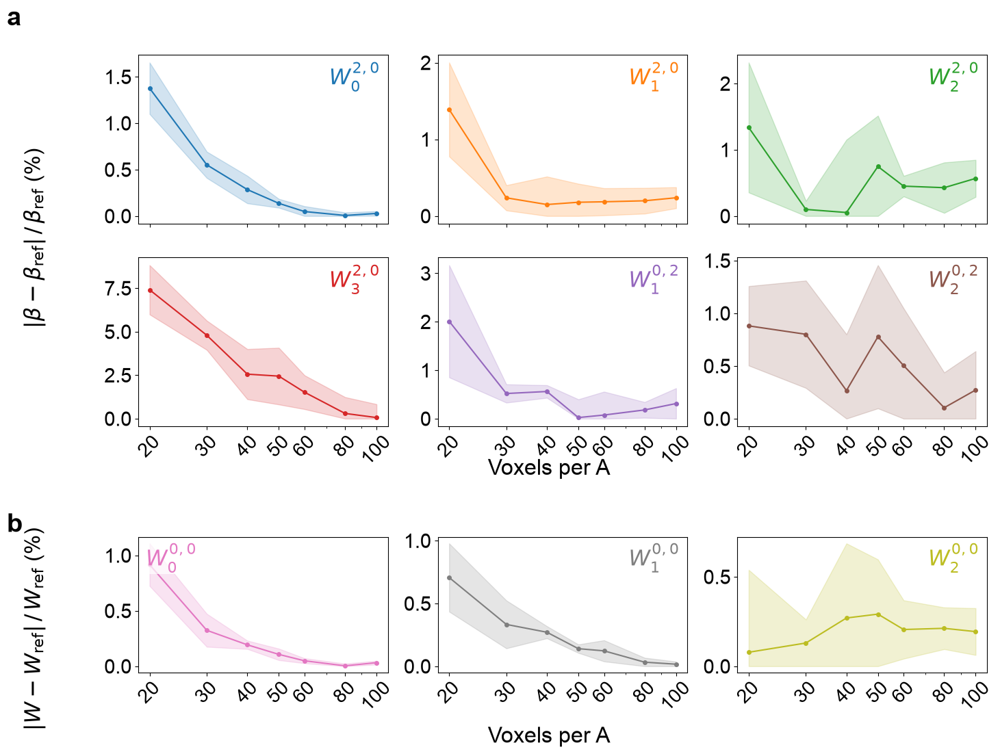

Saved -> /Users/yk/Desktop/pykarambola_m1/pykarambola/paper/notebooks/results/orientation_bias_bias_sigma_pct_rot_y.pdf


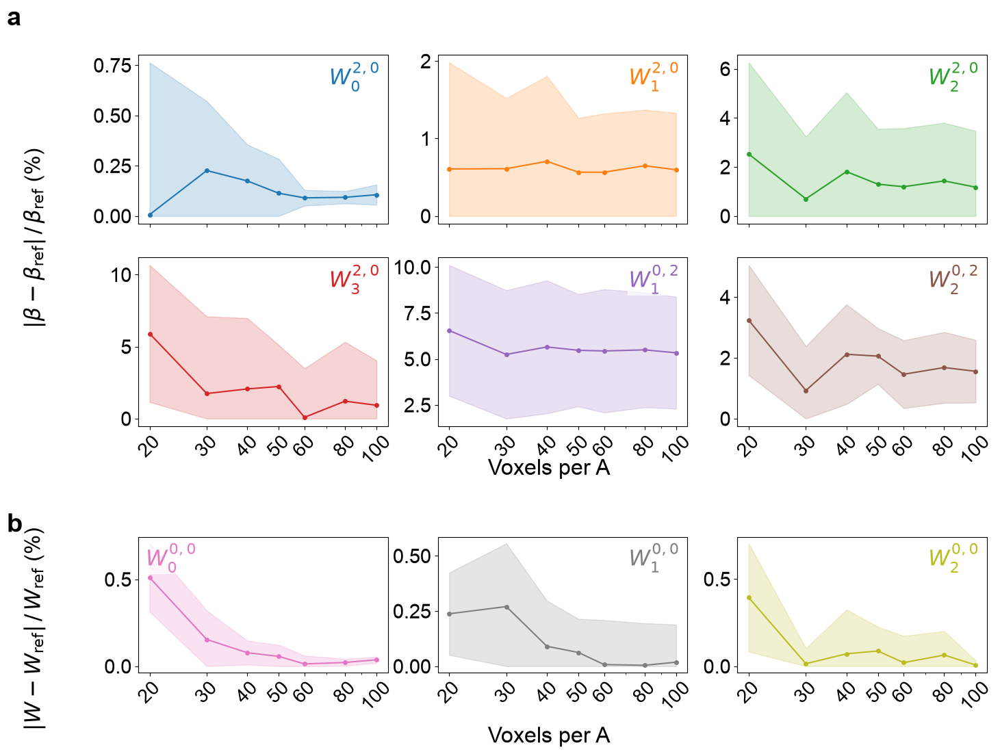

In [14]:
# ── Figure: |bias| ± σ as % of reference vs resolution — tensors (a) + scalars (b) ──
# abs_bias_pct = |mean − ref| / |ref| × 100  %   (absolute deviation, always ≥ 0)
# sigma_pct    =  std          / |ref| × 100  %   (orientation spread, always ≥ 0)
# shaded band  = abs_bias ± sigma  (lower clipped at 0)
# w300 (Euler characteristic) preserved exactly by marching cubes — omitted.
# Only hi-res range shown: A/20 to A/100 (20–100 voxels per A).

plt.rcParams['font.family'] = 'Arial'
plt.rcParams.update({
    'font.size':       BASE_FONT,
    'axes.titlesize':  BASE_FONT - 2,
    'axes.labelsize':  BASE_FONT - 2,
    'xtick.labelsize': BASE_FONT - 4,
    'ytick.labelsize': BASE_FONT - 4,
    'legend.fontsize': BASE_FONT - 5,
})

_vpas_all = HIRES_DENOMS   # [20, 30, 40, 50, 60, 80, 100]

for proto in PROTOCOLS:
    fig     = plt.figure(figsize=(16, 11))
    subfigs = fig.subfigures(2, 1, height_ratios=[2, 1], hspace=0.08)

    # ── Panel a: six rank-2 tensor subplots ───────────────────────────────────
    sfig_t = subfigs[0]
    sfig_t.text(0.005, 0.98, 'a', fontsize=BASE_FONT + 2, fontweight='bold', va='top')
    axs_t  = sfig_t.subplots(2, 3, sharex=True)
    sfig_t.supxlabel('Voxels per A', fontsize=BASE_FONT - 2, y=0.0001)
    sfig_t.supylabel(
        r'$|\beta - \beta_\mathrm{ref}|\,/\,\beta_\mathrm{ref}$ (%)',
        fontsize=BASE_FONT - 2,
    )

    for idx, name in enumerate(RANK2):
        ax  = axs_t.flat[idx]
        ref = FINE_BETA[name]
        col = TENSOR_COLORS_PLOT[idx]

        abs_bias_pct = np.array([
            abs(DF_HI[(DF_HI['protocol'] == proto) & (DF_HI['voxel_size'] == vox)
                   ][f'{name}_beta'].mean() - ref) / abs(ref) * 100
            for vox in HIRES_VOXELS
        ])
        sigma_pct = np.array([
            DF_HI[(DF_HI['protocol'] == proto) & (DF_HI['voxel_size'] == vox)
               ][f'{name}_beta'].std() / abs(ref) * 100
            for vox in HIRES_VOXELS
        ])

        ax.fill_between(_vpas_all,
                        np.maximum(0, abs_bias_pct - sigma_pct),
                        abs_bias_pct + sigma_pct,
                        alpha=0.20, color=col)
        ax.plot(_vpas_all, abs_bias_pct, 'o-', ms=4, lw=1.5, color=col)
        ax.set_xscale('log')
        ax.set_xticks(_vpas_all)
        ax.set_xticklabels([str(v) for v in _vpas_all])
        ax.tick_params(axis='x', labelsize=BASE_FONT - 5, rotation=45)
        ax.text(0.97, 0.96, TENSOR_LATEX[name],
                transform=ax.transAxes, ha='right', va='top',
                fontsize=BASE_FONT - 2, color=col,
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=1))

    # ── Panel b: three scalar subplots (w300 omitted) ─────────────────────────
    sfig_s = subfigs[1]
    sfig_s.text(0.005, 0.98, 'b', fontsize=BASE_FONT + 2, fontweight='bold', va='top')
    axs_s  = sfig_s.subplots(1, 3, sharex=True)
    sfig_s.subplots_adjust(bottom=0.32)
    sfig_s.supxlabel('Voxels per A', fontsize=BASE_FONT - 2)
    sfig_s.supylabel(
        r'$|W - W_\mathrm{ref}|\,/\,W_\mathrm{ref}$ (%)',
        fontsize=BASE_FONT - 2,
    )

    for idx, sc in enumerate(SCALARS):
        ax  = axs_s[idx]
        ref = FINE_SCALARS[sc]
        col = _SC_COLORS[idx]

        abs_bias_pct = np.array([
            abs(DF_HI[(DF_HI['protocol'] == proto) & (DF_HI['voxel_size'] == vox)
                   ][sc].mean() - ref) / abs(ref) * 100
            for vox in HIRES_VOXELS
        ])
        sigma_pct = np.array([
            DF_HI[(DF_HI['protocol'] == proto) & (DF_HI['voxel_size'] == vox)
               ][sc].std() / abs(ref) * 100
            for vox in HIRES_VOXELS
        ])

        ax.fill_between(_vpas_all,
                        np.maximum(0, abs_bias_pct - sigma_pct),
                        abs_bias_pct + sigma_pct,
                        alpha=0.20, color=col)
        ax.plot(_vpas_all, abs_bias_pct, 'o-', ms=4, lw=1.5, color=col)
        ax.set_xscale('log')
        ax.set_xticks(_vpas_all)
        ax.set_xticklabels([str(v) for v in _vpas_all])
        ax.tick_params(axis='x', labelsize=BASE_FONT - 5, rotation=45)
        ann_x  = 0.03 if sc == 'w000' else 0.97
        ann_ha = 'left' if sc == 'w000' else 'right'
        ax.text(ann_x, 0.96, SCALAR_LATEX[sc],
                transform=ax.transAxes, ha=ann_ha, va='top',
                fontsize=BASE_FONT - 2, color=col,
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=1))

    save_path = os.path.join(RESULTS_DIR, f'orientation_bias_bias_sigma_pct_{proto}.pdf')
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    print(f'Saved -> {save_path}')
    plt.show()

Saved → /Users/yk/Desktop/pykarambola_m1/pykarambola/paper/notebooks/results/orientation_bias_beta_combined_rot_z.pptx
Saved -> /Users/yk/Desktop/pykarambola_m1/pykarambola/paper/notebooks/results/orientation_bias_beta_combined_rot_z.pdf


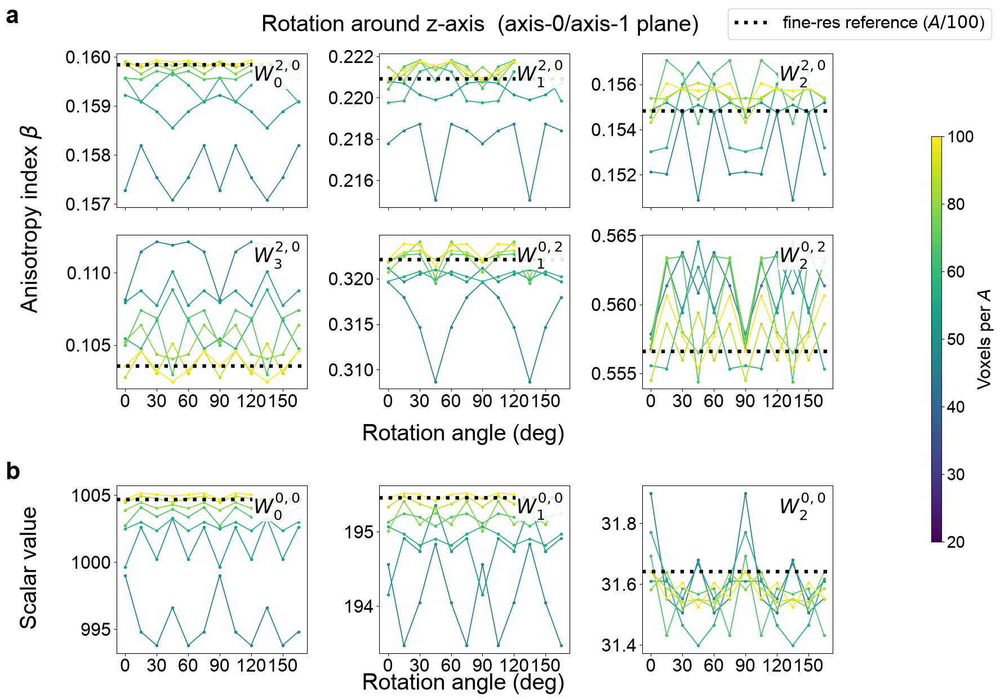

Saved → /Users/yk/Desktop/pykarambola_m1/pykarambola/paper/notebooks/results/orientation_bias_beta_combined_rot_y.pptx
Saved -> /Users/yk/Desktop/pykarambola_m1/pykarambola/paper/notebooks/results/orientation_bias_beta_combined_rot_y.pdf


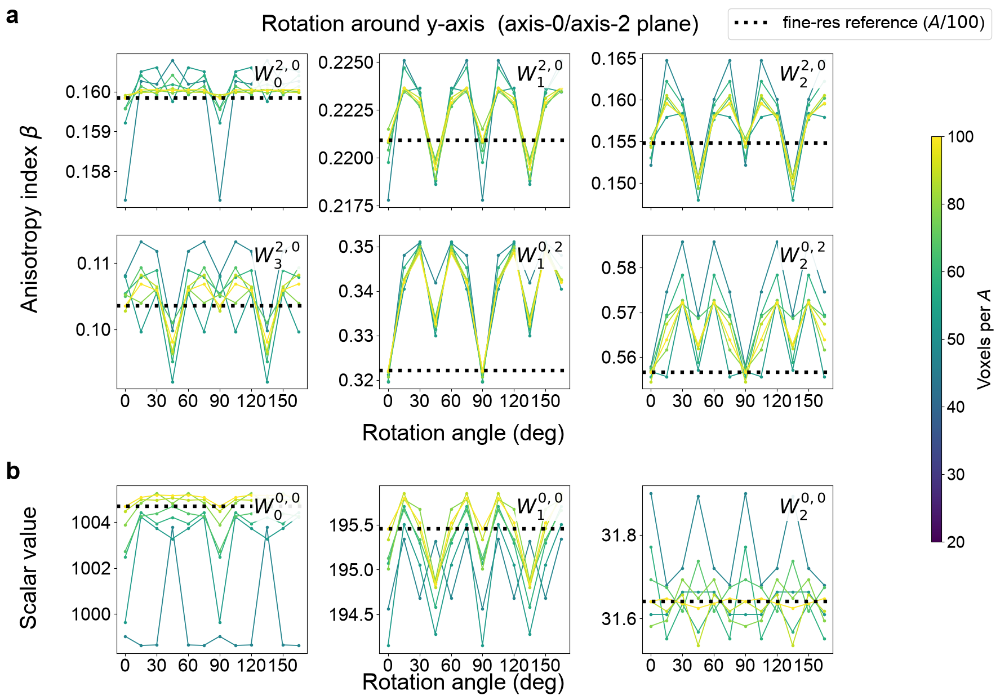

In [15]:
# common look-and-feel
LABEL_FS = BASE_FONT + 4     # shared axis labels (bigger)
PANEL_FS = BASE_FONT + 6     # a / b panel letters
ANNOT_FS = BASE_FONT + 1     # per-subplot W-name
TICK_FS  = BASE_FONT - 2
plt.rcParams['font.family'] = 'Arial'

def _add_res_colorbar(cbar_sf):
    norm = plt.Normalize(vmin=0, vmax=N_HIRES - 1)
    sm = plt.cm.ScalarMappable(cmap=VOX_CMAP, norm=norm); sm.set_array([])
    cax = cbar_sf.add_axes([0.05, 0.20, 0.35, 0.60])      # [x, y, w, h] within the strip
    cbar = cbar_sf.colorbar(sm, cax=cax, label='Voxels per $A$')
    cbar.set_ticks(range(N_HIRES))
    cbar.set_ticklabels([int(A / v) for v in HIRES_VOXELS])

for proto in PROTOCOLS:
    DFp = DF_HI[DF_HI['protocol'] == proto]
    fig = plt.figure(figsize=(17, 12))
    outer = fig.subfigures(1, 2, width_ratios=[32, 1], wspace=0.01)   # main | colorbar strip
    main_sf, cbar_sf = outer
    subfigs = main_sf.subfigures(2, 1, height_ratios=[2, 1], hspace=0.07)

    # panel a — six rank-2 tensors, beta vs angle
    sfa = subfigs[0]
    sfa.text(0.005, 0.99, 'a', fontsize=PANEL_FS, fontweight='bold', va='top')
    axs_t = sfa.subplots(2, 3, sharex=True,
                         gridspec_kw={'wspace': 0.38, 'hspace': 0.18})
    for idx, name in enumerate(RANK2):
        ax = axs_t.flat[idx]
        for vox, col in zip(HIRES_VOXELS, HIRES_COLORS):
            sub = DFp[DFp['voxel_size'] == vox].sort_values('angle_deg')
            ax.plot(sub['angle_deg'], sub[f'{name}_beta'], 'o-', ms=3, lw=1.3, color=col)
        ax.axhline(FINE_BETA[name], color='black', ls=':', lw=4.6)
        ax.set_xticks(ANGLES[::2]); ax.tick_params(labelsize=TICK_FS)
        ax.text(0.97, 0.96, TENSOR_LATEX[name], transform=ax.transAxes,
                ha='right', va='top', fontsize=ANNOT_FS,
                bbox=dict(facecolor='white', alpha=0.9, edgecolor='none', pad=1))
    sfa.supxlabel('Rotation angle (deg)', fontsize=LABEL_FS, y = -0.02)
    sfa.supylabel(r'Anisotropy index $\beta$', fontsize=LABEL_FS)

    # panel b — three scalars, value vs angle
    sfb = subfigs[1]
    sfb.text(0.005, 0.99, 'b', fontsize=PANEL_FS, fontweight='bold', va='top')
    axs_s = sfb.subplots(1, 3, sharex=True,
                         gridspec_kw={'wspace': 0.38})
    for idx, sc in enumerate(SCALARS):
        ax = axs_s[idx]
        for vox, col in zip(HIRES_VOXELS, HIRES_COLORS):
            sub = DFp[DFp['voxel_size'] == vox].sort_values('angle_deg')
            ax.plot(sub['angle_deg'], sub[sc], 'o-', ms=3, lw=1.3, color=col)
        ax.axhline(FINE_SCALARS[sc], color='black', ls=':', lw=4.6)
        ax.set_xticks(ANGLES[::2]); ax.tick_params(labelsize=TICK_FS)
        ax.text(0.97, 0.96, SCALAR_LATEX[sc], transform=ax.transAxes,
                ha='right', va='top', fontsize=ANNOT_FS,
                bbox=dict(facecolor='white', alpha=0.9, edgecolor='none', pad=1))
    sfb.supxlabel('Rotation angle (deg)', fontsize=LABEL_FS, y = -0.08)
    sfb.supylabel('Scalar value', fontsize=LABEL_FS)

    _add_res_colorbar(cbar_sf)
    fig.legend(handles=[Line2D([0], [0], color='black', ls=':', lw=4.6,
                               label=r'fine-res reference ($A/100$)')],
               loc='upper right', fontsize=BASE_FONT - 3, framealpha=0.9)
    fig.suptitle(PROT_LABELS[proto], fontsize=LABEL_FS)

    save_path = os.path.join(RESULTS_DIR, f'orientation_bias_beta_combined_{proto}.pdf')
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    save_figure_pptx(save_path.replace('.pdf', '.pptx'))
    print(f'Saved -> {save_path}'); plt.show()